In [1]:
%run './model/multi_corpus.py'
%run './constants.py'

import polars as pl
import numpy as np

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from gensim.models.doc2vec import Doc2Vec, TaggedDocument

import umap.umap_ as umap

import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

In [3]:
corpora = Corpora(DATA_PATH)

Gender Studies (3465, 12)
Neurology (37290, 12)
Artificial Intelligence (7223, 12)
Sociology (4769, 12)
Ethnic & Cultural Studies (3153, 12)
Law (520, 12)
Material Engineering (55131, 12)
Human Resources & Organizations (7047, 12)
Political Science (6598, 12)
Immunology (40300, 12)
Genetics & Genomics (30380, 12)
Economics (8416, 12)
International Business (6749, 12)
Language & Linguistics (3890, 12)
Probability & Statistics (6925, 12)
Geometry (3946, 12)
Geophysics (45821, 12)


In [4]:
def vectorization_method(method, texts):
    match method:
        case 'tfidf':
            tfidf = TfidfVectorizer()
            vecs = tfidf.fit_transform(texts.to_list()).toarray()
        case 'doc2vec':
            documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(texts.str.split(' ').to_list())]
            model = Doc2Vec(documents, vector_size=100, window=2, min_count=1, workers=4)
            vecs = np.array([model.dv[i] for i in range(len(texts))])
    return vecs

In [5]:
n_cols = 4
n_rows = np.ceil(len(corpora.data) / n_cols)

# PCA (TfIdf)

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

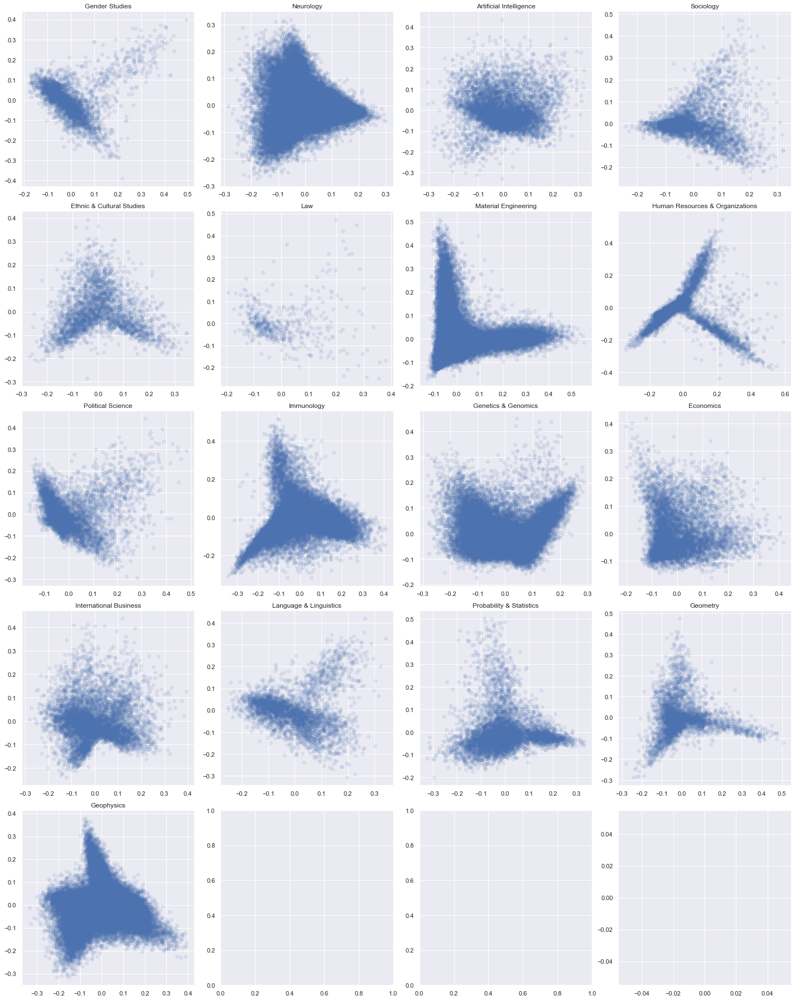

In [9]:
vec_method = 'tfidf' # doc2vec, tfidf

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, data), ax in zip(corpora.data.items(), axs.flatten()):

    print(field_name)

    df = data['citation_df']
    dois, texts = df.select([pl.col('Doi'), pl.col('Text')])

    vecs = vectorization_method(vec_method, texts)
    
    embs = PCA(
        n_components=2, 
        random_state=42
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    ax.set_title(field_name)

fig.tight_layout()
# plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_pca_{vec_method}.png')
plt.plot()

# 47 min

# tSNE (TfIdf)

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

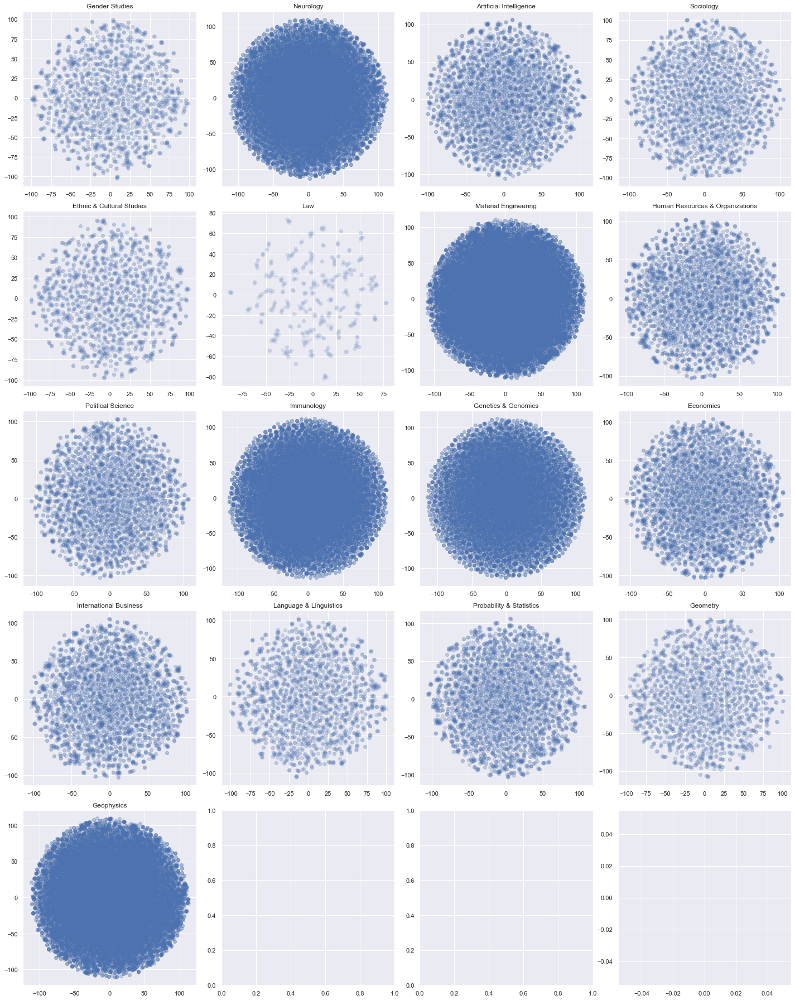

In [10]:
vec_method = 'tfidf' # doc2vec, tfidf

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, data), ax in zip(corpora.data.items(), axs.flatten()):

    print(field_name)

    df = data['citation_df']
    dois, texts = df.select([pl.col('Doi'), pl.col('Text')])

    vecs = vectorization_method(vec_method, texts)
    
    embs = TSNE(
        n_components=2, 
        random_state=1, 
        # n_iter=1000,
        metric='cosine',
        learning_rate='auto', 
        init='random', 
        perplexity=3
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    ax.set_title(field_name)

fig.tight_layout()
# plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_tsne_{vec_method}.png')
plt.plot()

# 307 min

# UMAP (TfIdf)

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

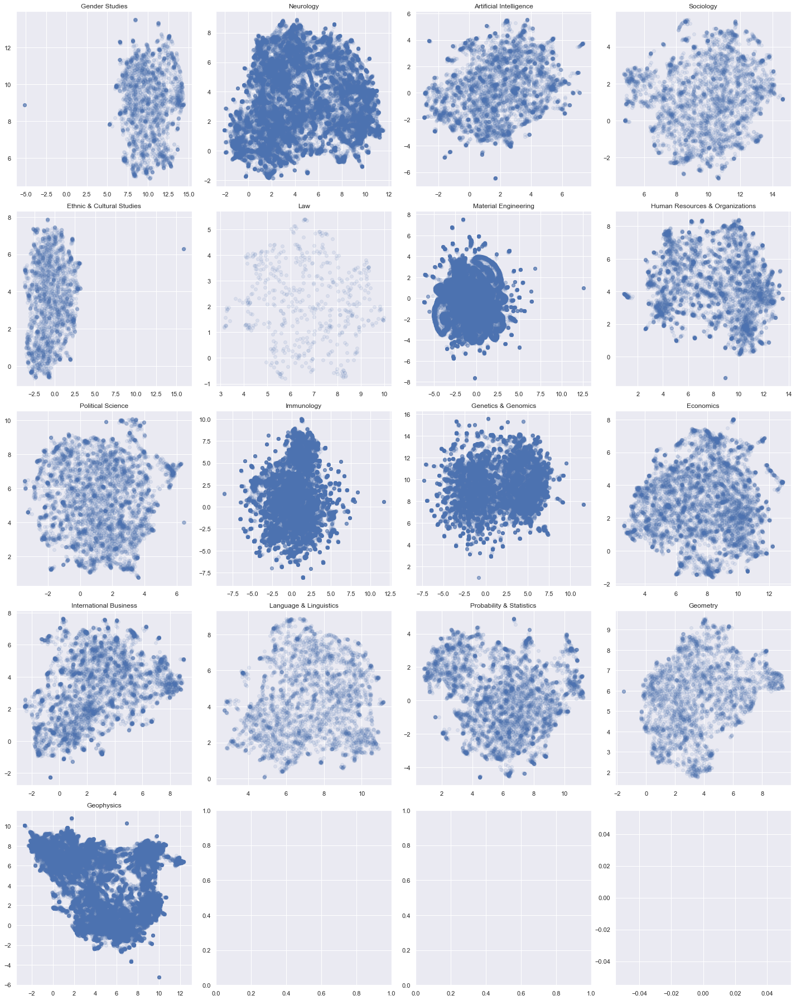

In [8]:
vec_method = 'tfidf' # doc2vec, tfidf

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, data), ax in zip(corpora.data.items(), axs.flatten()):

    print(field_name)

    df = data['citation_df']
    dois, texts = df.select([pl.col('Doi'), pl.col('Text')])

    vecs = vectorization_method(vec_method, texts)
    
    reducer = umap.UMAP(random_state=42)
    embs = reducer.fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    
    ax.set_title(field_name)

fig.tight_layout()
# plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_umap_{vec_method}.png')
plt.plot()

# 52 min

# PCA (Doc2Vec)

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

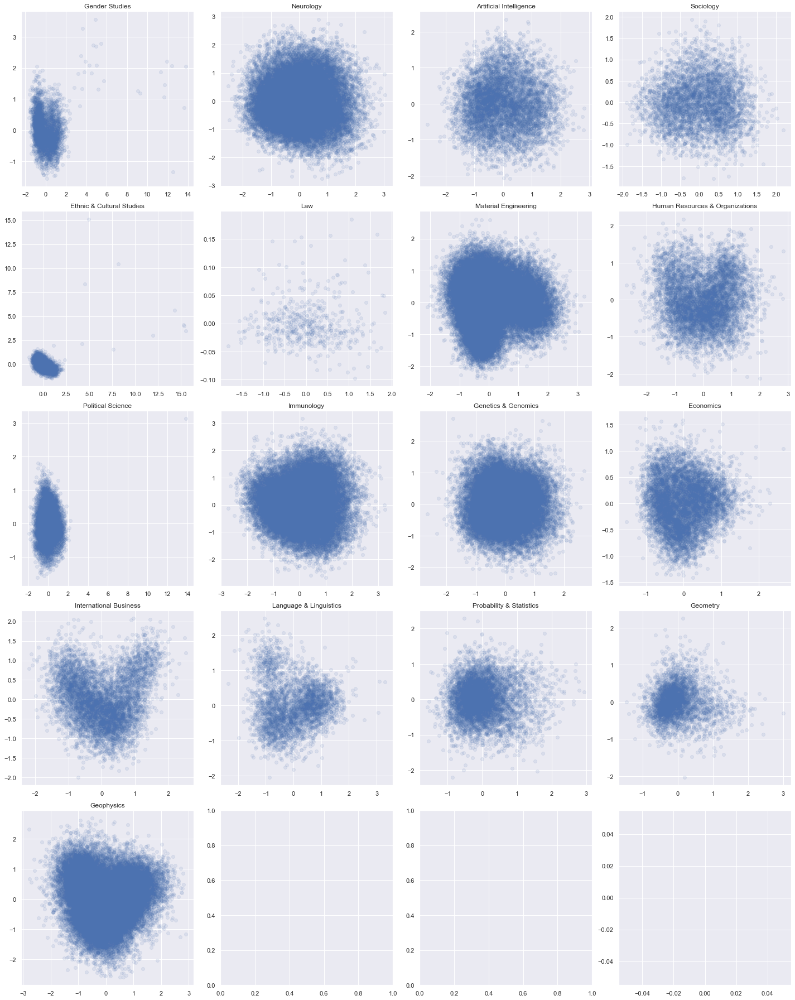

In [11]:
vec_method = 'doc2vec' # doc2vec, tfidf

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, data), ax in zip(corpora.data.items(), axs.flatten()):

    print(field_name)

    df = data['citation_df']
    dois, texts = df.select([pl.col('Doi'), pl.col('Text')])

    vecs = vectorization_method(vec_method, texts)
    
    embs = PCA(
        n_components=2, 
        random_state=42
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    ax.set_title(field_name)

fig.tight_layout()
plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_pca_{vec_method}.png')
plt.plot()

# 4 min

# tSNE (Doc2Vec)

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

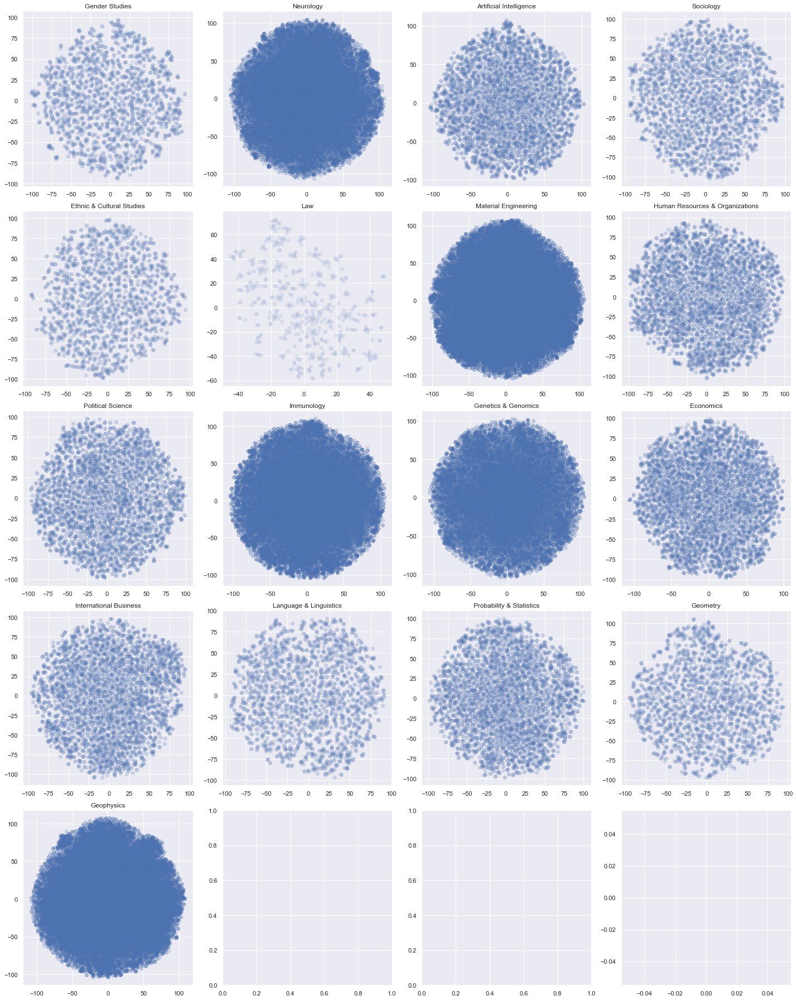

In [14]:
vec_method = 'doc2vec' # doc2vec, tfidf

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, data), ax in zip(corpora.data.items(), axs.flatten()):

    print(field_name)

    df = data['citation_df']
    dois, texts = df.select([pl.col('Doi'), pl.col('Text')])

    vecs = vectorization_method(vec_method, texts)
    
    embs = TSNE(
        n_components=2, 
        random_state=1, 
        # n_iter=1000,
        metric='cosine',
        learning_rate='auto', 
        init='random', 
        perplexity=3
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    ax.set_title(field_name)

fig.tight_layout()
plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_tsne_{vec_method}.png')
plt.plot()

# UMAP (Doc2Vec)

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

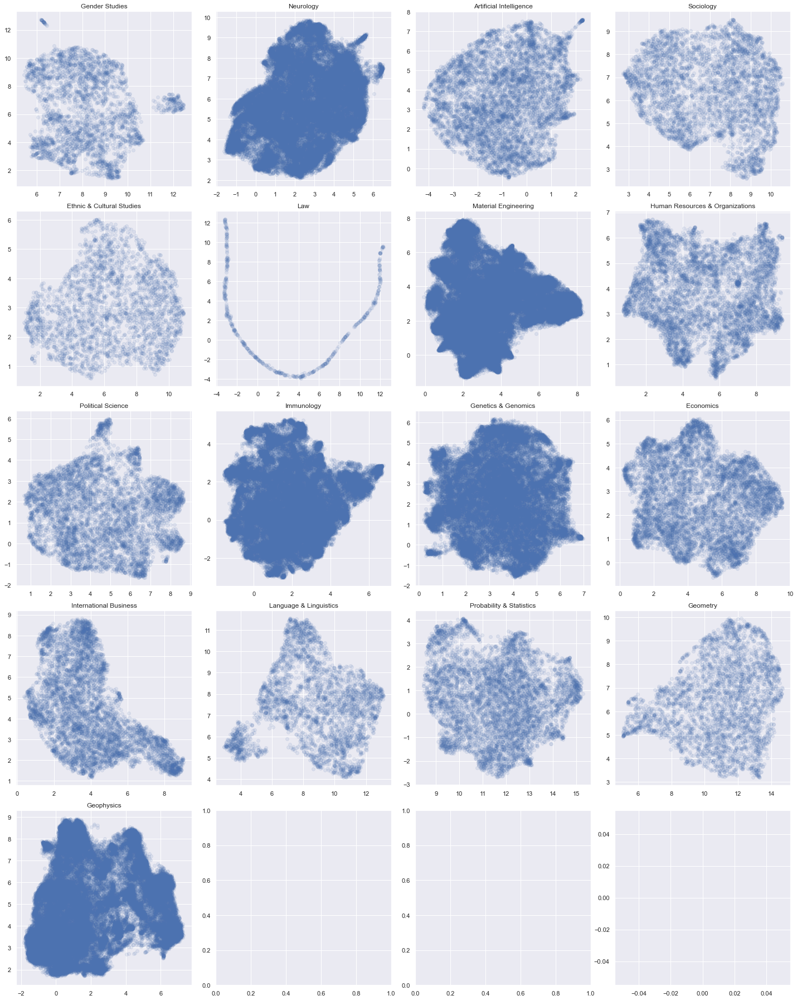

In [13]:
vec_method = 'doc2vec' # doc2vec, tfidf

fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, data), ax in zip(corpora.data.items(), axs.flatten()):

    print(field_name)

    df = data['citation_df']
    dois, texts = df.select([pl.col('Doi'), pl.col('Text')])

    vecs = vectorization_method(vec_method, texts)
    
    reducer = umap.UMAP(random_state=42)
    embs = reducer.fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    
    ax.set_title(field_name)

fig.tight_layout()
plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_umap_{vec_method}.png')
plt.plot()

# Node2Vec

In [6]:
import torch
from torch_geometric.data import Data
from torch_geometric.nn import Node2Vec
from torch_geometric.utils.convert import to_networkx, from_networkx
import sklearn

Gender Studies: 1.3478
Neurology: 0.7525
Artificial Intelligence: 0.8642
Sociology: 0.9986
Ethnic & Cultural Studies: 1.3330
Law: 3.7426
Material Engineering: 0.7399
Human Resources & Organizations: 0.8569
Political Science: 0.8835
Immunology: 0.7696
Genetics & Genomics: 0.7485
Economics: 0.8204
International Business: 0.8762
Language & Linguistics: 1.1195
Probability & Statistics: 0.8933
Geometry: 1.8285
Geophysics: 0.7321


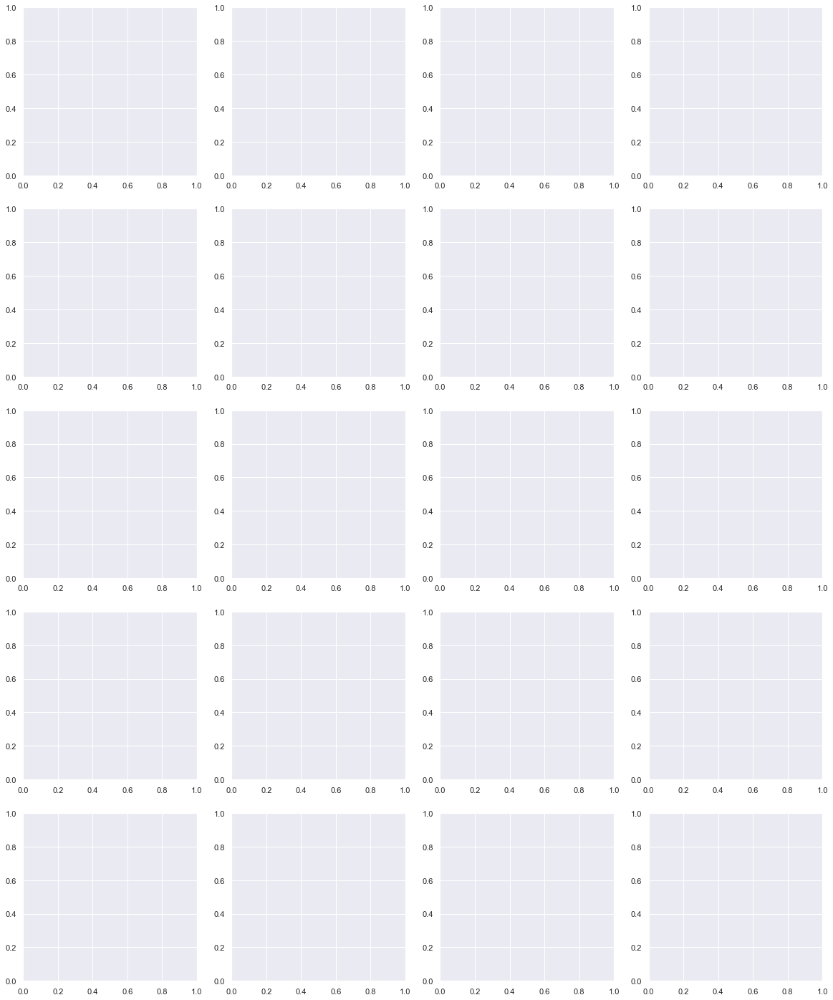

In [7]:
embedding_dim = 128
walk_length = 20
context_size = 10
walks_per_node = 10

epochs = 10
train_size = 0.70

device = 'cuda' if torch.cuda.is_available() else 'cpu'

embs_dict = {}

for (field_name, data), ax in zip(corpora.data.items(), axs.flatten()):

    G_citation = data['citation_graph']

    pyg_citation = from_networkx(G_citation)

    nodes = pyg_citation.edge_index.numpy()
    nodes = np.unique(list(nodes[0]) + list(nodes[1]))

    train_set, test_val_set = sklearn.model_selection.train_test_split(nodes, train_size=train_size, random_state=1)
    test_set, val_set = sklearn.model_selection.train_test_split(test_val_set, train_size=0.5, random_state=1)

    # build test train val masks
    train_mask = torch.zeros(len(nodes), dtype=torch.long, device=device)
    for i in train_set:
        train_mask[i] = 1.

    test_mask = torch.zeros(len(nodes), dtype=torch.long, device=device)
    for i in test_set:
        test_mask[i] = 1.
        
    val_mask = torch.zeros(len(nodes), dtype=torch.long, device=device)
    for i in val_set:
        val_mask[i] = 1.

    pyg_citation.train_mask = train_mask
    pyg_citation.test_mask = test_mask
    pyg_citation.val_mask = val_mask

    node_model = Node2Vec(
        pyg_citation.edge_index,
        embedding_dim=embedding_dim,
        walk_length=walk_length,
        context_size=context_size,
        walks_per_node=walks_per_node,
        num_negative_samples=1,
        p=1,
        q=1,
        sparse=True
    ).to(device)

    loader = node_model.loader(batch_size=128, shuffle=True, num_workers=4)
    optimizer = torch.optim.SparseAdam(list(node_model.parameters()), lr=0.01)

    for epoch in range(epochs):

        node_model.train()
        total_loss = 0
        for pos_rw, neg_rw in loader:
            optimizer.zero_grad()
            loss = node_model.loss(pos_rw.to(device), neg_rw.to(device))
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        loss = total_loss / len(loader)
        
        if epoch == epochs-1:
            print(f'{field_name}: {loss:.4f}')

    node_model = node_model()
    embs = node_model.detach().cpu().numpy()

    embs_dict[field_name] = embs

# 180 min

# PCA

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

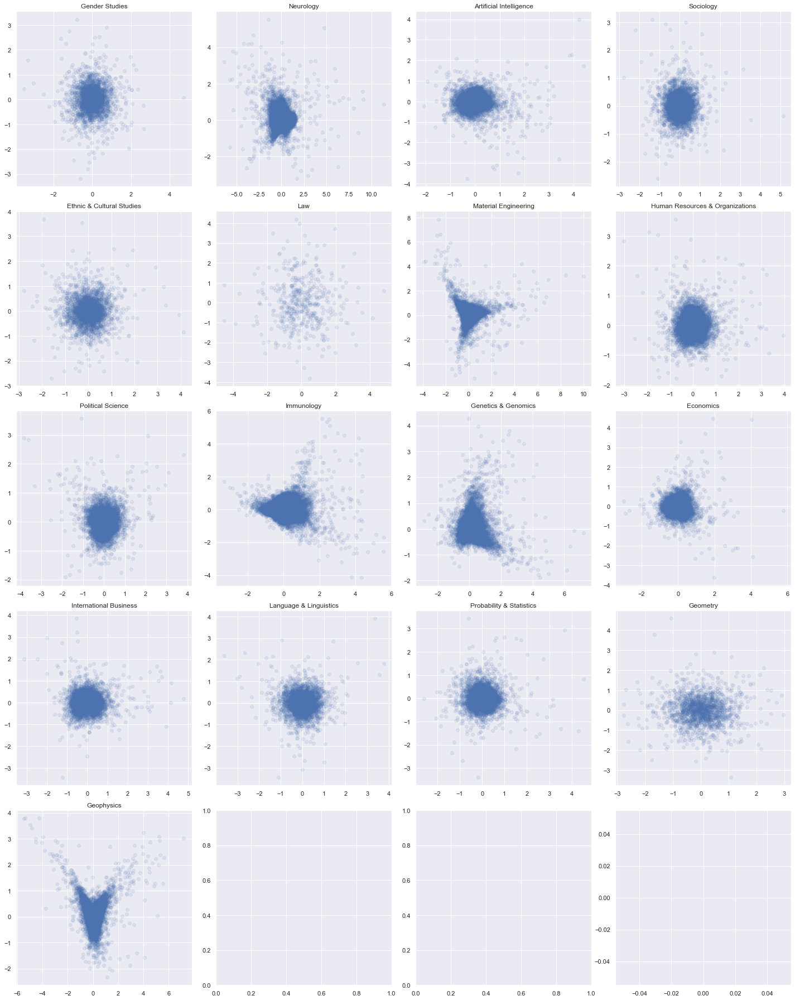

In [8]:
fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, vecs), ax in zip(embs_dict.items(), axs.flatten()):

    print(field_name)
    
    embs = PCA(
        n_components=2, 
        random_state=42
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    ax.set_title(field_name)

fig.tight_layout()
# plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_pca_node2vec.png')
plt.plot()

# 4 min

# tSNE

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

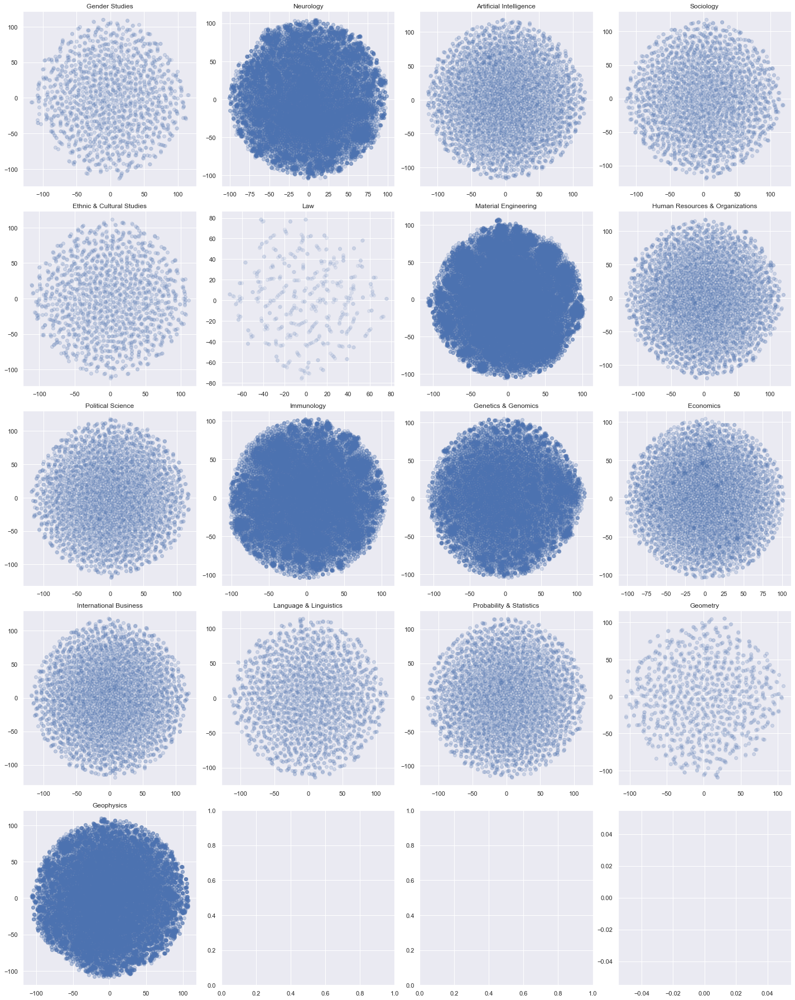

In [10]:
fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, vecs), ax in zip(embs_dict.items(), axs.flatten()):

    print(field_name)

    embs = TSNE(
        n_components=2, 
        random_state=1, 
        # n_iter=1000,
        metric='cosine',
        learning_rate='auto', 
        init='random', 
        perplexity=3
    ).fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    ax.set_title(field_name)

fig.tight_layout()
# plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_tsne_node2vec.png')
plt.plot()

# UMAP

Gender Studies
Neurology
Artificial Intelligence
Sociology
Ethnic & Cultural Studies
Law
Material Engineering
Human Resources & Organizations
Political Science
Immunology
Genetics & Genomics
Economics
International Business
Language & Linguistics
Probability & Statistics
Geometry
Geophysics


[]

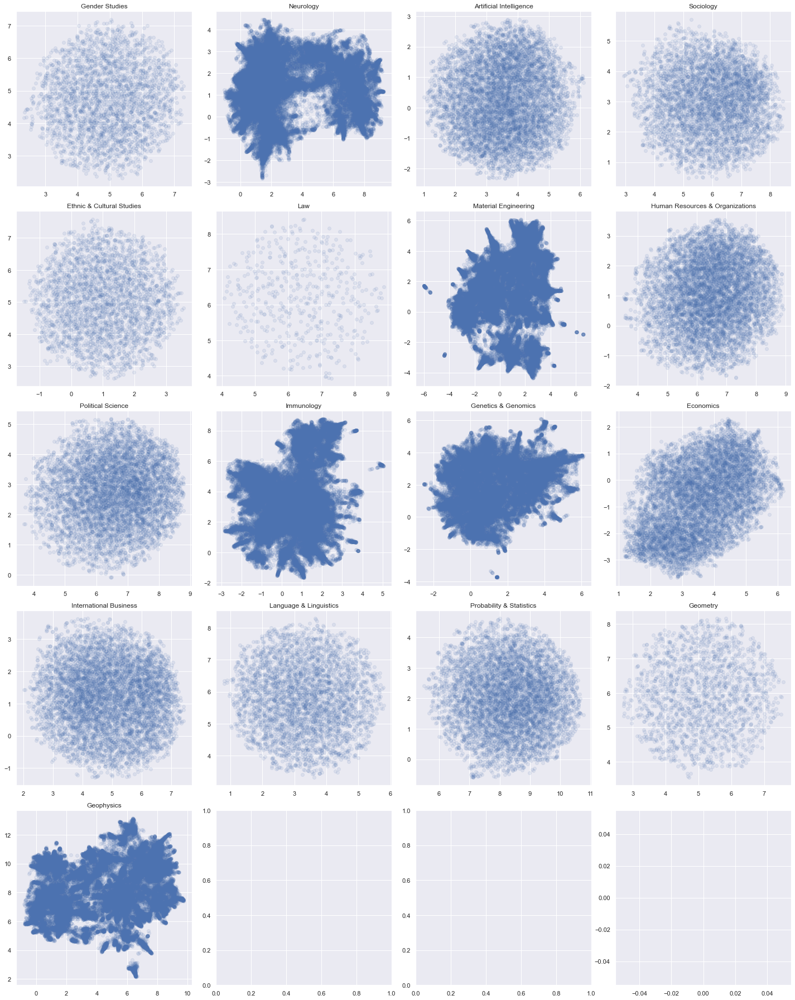

In [9]:
fig, axs = plt.subplots(int(n_rows), int(n_cols), figsize=(n_cols*5, n_rows*5))
for (field_name, vecs), ax in zip(embs_dict.items(), axs.flatten()):

    print(field_name)
    
    reducer = umap.UMAP(random_state=42)
    embs = reducer.fit_transform(vecs)

    ax.scatter(embs[:, 0], embs[:, 1], alpha=.1)
    
    ax.set_title(field_name)

fig.tight_layout()
# plt.savefig(f'{OBSIDIAN_IMG_PATH}/semantic_umap_node2vec.png')
plt.plot()